<a href="https://colab.research.google.com/github/codingbot4/ds_project/blob/main/ProjectV01.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import sys
!{sys.executable} -m pip install -U pandas-profiling
!jupyter nbextension enable --py widgetsnbextension
!pip install stats
!pip install skimpy
!pip install ydata_profiling
!pip install awswrangler
!pip install graphviz
!pip install pydot


In [2]:

#Step -1 : import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import scipy.stats as stats
import pydot
import graphviz
#from ydata_profiling import ProfileReport
from pandas_profiling import ProfileReport
from skimpy import skim


pd.option_context('display.max_columns',None)

/tmp/ipykernel_29938/1317226449.py:11: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [3]:
# import data

from google.colab import drive
drive.mount('/content/drive')

file_path = "/content/drive/My Drive/Sample-Superstore.csv"

df = pd.read_csv(file_path, encoding = 'latin-1') # Load the Data

df.head()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,1,CA-2016-152156,11/8/2016,11/11/2016,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.9600,2,0.00,41.9136
1,2,CA-2016-152156,11/8/2016,11/11/2016,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.9400,3,0.00,219.5820
2,3,CA-2016-138688,6/12/2016,6/16/2016,Second Class,DV-13045,Darrin Van Huff,Corporate,United States,Los Angeles,...,90036,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters b...,14.6200,2,0.00,6.8714
3,4,US-2015-108966,10/11/2015,10/18/2015,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,...,33311,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775,5,0.45,-383.0310
4,5,US-2015-108966,10/11/2015,10/18/2015,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,...,33311,South,OFF-ST-10000760,Office Supplies,Storage,Eldon Fold 'N Roll Cart System,22.3680,2,0.20,2.5164


In [4]:
# change the heading of the data set to lower case and the balnks to '_' (snake case)
df.rename(lambda x: x.lower().strip().replace(' ','_'), axis='columns',inplace=True) 

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9994 entries, 0 to 9993
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   row_id         9994 non-null   int64  
 1   order_id       9994 non-null   object 
 2   order_date     9994 non-null   object 
 3   ship_date      9994 non-null   object 
 4   ship_mode      9994 non-null   object 
 5   customer_id    9994 non-null   object 
 6   customer_name  9994 non-null   object 
 7   segment        9994 non-null   object 
 8   country        9994 non-null   object 
 9   city           9994 non-null   object 
 10  state          9994 non-null   object 
 11  postal_code    9994 non-null   int64  
 12  region         9994 non-null   object 
 13  product_id     9994 non-null   object 
 14  category       9994 non-null   object 
 15  sub-category   9994 non-null   object 
 16  product_name   9994 non-null   object 
 17  sales          9994 non-null   float64
 18  quantity

# to find out the Null Values

In [6]:
df.isnull().sum()


row_id           0
order_id         0
order_date       0
ship_date        0
ship_mode        0
customer_id      0
customer_name    0
segment          0
country          0
city             0
state            0
postal_code      0
region           0
product_id       0
category         0
sub-category     0
product_name     0
sales            0
quantity         0
discount         0
profit           0
dtype: int64

# Based on the above result , here are no null values in the data set

# check the duplicate rows in the data set


In [7]:
duplicate_rows = df[df.duplicated()]
print(duplicate_rows)


Empty DataFrame
Columns: [row_id, order_id, order_date, ship_date, ship_mode, customer_id, customer_name, segment, country, city, state, postal_code, region, product_id, category, sub-category, product_name, sales, quantity, discount, profit]
Index: []

[0 rows x 21 columns]


# remove the duplicate rows from the data set 


In [8]:
df = df.drop_duplicates()

In [9]:
#convert the type to string so it should not appear as numeric for the analysis purpose 
df['row_id'] = df['row_id'].astype(str)
df['postal_code'] = df['postal_code'].astype(str)


In [10]:
# select the non numeric columns
non_numeric = df.select_dtypes(include=['object', 'category'])

#the column will be dropped if there is only one value in that column
for column in non_numeric.columns:
    if non_numeric[column].nunique() == 1:
        df = df.drop(column, axis=1)


In [11]:
#with pd.option_context('display.float_format','{:.5f}'.format):
df.describe().T

,count,mean,std,min,25%,50%,75%,max
sales,9994.0,229.858001,623.245101,0.444,17.28000,54.4900,209.940,22638.480
quantity,9994.0,3.789574,2.225110,1.000,2.00000,3.0000,5.000,14.000
discount,9994.0,0.156203,0.206452,0.000,0.00000,0.2000,0.200,0.800
profit,9994.0,28.656896,234.260108,-6599.978,1.72875,8.6665,29.364,8399.976


In [12]:
skim(df)

╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                                                                 │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                          │
│ ┃ dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃                                                          │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                          │
│ │ Number of rows    │ 9994   │ │ string      │ 16    │                                                          │
│ │ Number of columns │ 20     │ │ float64     │ 3     │                                                          │
│ └───────────────────┴────────┘ │ int64       │ 1     │                                                          │
│                                └─────────────┴───────┘                                                          │
│                                                     number                                                      │
│ ┏━━━━━━━━━━━━━━━━━━━━┳━━━━━━┳━━━━━━━━━┳━━━━━━━━━┳━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━┳━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┓  │
│ ┃ column_name        ┃ NA   ┃ NA %    ┃ mean    ┃ sd      ┃ p0        ┃ p25   ┃ p75   ┃ p100     ┃ hist      ┃  │
│ ┡━━━━━━━━━━━━━━━━━━━━╇━━━━━━╇━━━━━━━━━╇━━━━━━━━━╇━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━╇━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━┩  │
│ │ sales              │    0 │       0 │     230 │     620 │      0.44 │    17 │   210 │    23000 │     █     │  │
│ │ quantity           │    0 │       0 │     3.8 │     2.2 │         1 │     2 │     5 │       14 │   █▃▂▁    │  │
│ │ discount           │    0 │       0 │    0.16 │    0.21 │         0 │     0 │   0.2 │      0.8 │  █▆   ▁   │  │
│ │ profit             │    0 │       0 │      29 │     230 │     -6600 │   1.7 │    29 │     8400 │      █    │  │
│ └────────────────────┴──────┴─────────┴─────────┴─────────┴───────────┴───────┴───────┴──────────┴───────────┘  │
│                                                     string                                                      │
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━┓  │
│ ┃ column_name                  ┃ NA     ┃ NA %       ┃ words per row               ┃ total words             ┃  │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━┩  │
│ │ row_id                       │      0 │          0 │                           1 │                   10000 │  │
│ │ order_id                     │      0 │          0 │                           1 │                   10000 │  │
│ │ order_date                   │      0 │          0 │                           1 │                   10000 │  │
│ │ ship_date                    │      0 │          0 │                           1 │                   10000 │  │
│ │ ship_mode                    │      0 │          0 │                           1 │                   10000 │  │
│ │ customer_id                  │      0 │          0 │                           1 │                   10000 │  │
│ │ customer_name                │      0 │          0 │                           1 │                   10000 │  │
│ │ segment                      │      0 │          0 │                           1 │                   10000 │  │
│ │ city                         │      0 │          0 │                           1 │                   10000 │  │
│ │ state                        │      0 │          0 │                           1 │                   10000 │  │
│ │ postal_code                  │      0 │          0 │                           1 │                   10000 │  │
│ │ region                       │      0 │          0 │                           1 │                   10000 │  │
│ │ product_id                   │      0 │          0 │

In [13]:
#pre-processing of data
df['order_date'] = pd.to_datetime(df['order_date'], format='%m/%d/%Y') # Convert the data to proper date format
df['ship_date'] = pd.to_datetime(df['ship_date'], format='%m/%d/%Y') # Convert the data to proper date format
df['no_of_days_for_shipping'] = (df['ship_date']-df['order_date']).dt.days # Calculate the number of days used in the shipping of goods 
df['sale_price_per_unit'] = (df['sales'] - df['discount'])/df['quantity'] # Discount is adjusted to calculate the per unit sale cost
df['profit_per_unit'] = df['profit']/df['quantity'] 
df['purchase_price_per_unit'] = df['sale_price_per_unit'] - df['profit_per_unit']
df['purchase_price'] = df['purchase_price_per_unit'] * df['quantity']
df['weekday_string'] = df['ship_date'].dt.strftime('%A') #Find out the week day from the ship_date

df.loc[df['ship_date'].dt.year == 2018, 'ship_date'] = pd.to_datetime('2017-12-31') # for the simplicity purpose the ship date for the first week of 2018 is changed to last date of 2017 



In [14]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
sales,9994.0,229.858001,623.245101,0.4440,17.28000,54.4900,209.9400,22638.480000
quantity,9994.0,3.789574,2.225110,1.0000,2.00000,3.0000,5.0000,14.000000
discount,9994.0,0.156203,0.206452,0.0000,0.00000,0.2000,0.2000,0.800000
profit,9994.0,28.656896,234.260108,-6599.9780,1.72875,8.6665,29.3640,8399.976000
no_of_days_for_shipping,9994.0,3.958175,1.747567,0.0000,3.00000,4.0000,5.0000,7.000000
sale_price_per_unit,9994.0,60.862121,142.930143,-0.3560,5.40200,16.2360,63.8845,3772.996667
profit_per_unit,9994.0,7.799372,56.074974,-1319.9956,0.72280,2.7670,8.7032,1679.995200
purchase_price_per_unit,9994.0,53.062749,122.246961,0.4544,3.43240,12.7859,54.5220,4074.843067
purchase_price,9994.0,201.044902,550.826767,0.5544,12.49670,41.5770,181.9095,24449.058400


In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9994 entries, 0 to 9993
Data columns (total 26 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   row_id                   9994 non-null   object        
 1   order_id                 9994 non-null   object        
 2   order_date               9994 non-null   datetime64[ns]
 3   ship_date                9994 non-null   datetime64[ns]
 4   ship_mode                9994 non-null   object        
 5   customer_id              9994 non-null   object        
 6   customer_name            9994 non-null   object        
 7   segment                  9994 non-null   object        
 8   city                     9994 non-null   object        
 9   state                    9994 non-null   object        
 10  postal_code              9994 non-null   object        
 11  region                   9994 non-null   object        
 12  product_id               9994 non-

In [16]:
df.head()

,row_id,order_id,order_date,ship_date,ship_mode,customer_id,customer_name,segment,city,state,...,sales,quantity,discount,profit,no_of_days_for_shipping,sale_price_per_unit,profit_per_unit,purchase_price_per_unit,purchase_price,weekday_string
0,1,CA-2016-152156,2016-11-08,2016-11-11,Second Class,CG-12520,Claire Gute,Consumer,Henderson,Kentucky,...,261.9600,2,0.00,41.9136,3,130.9800,20.9568,110.0232,220.0464,Friday
1,2,CA-2016-152156,2016-11-08,2016-11-11,Second Class,CG-12520,Claire Gute,Consumer,Henderson,Kentucky,...,731.9400,3,0.00,219.5820,3,243.9800,73.1940,170.7860,512.3580,Friday
2,3,CA-2016-138688,2016-06-12,2016-06-16,Second Class,DV-13045,Darrin Van Huff,Corporate,Los Angeles,California,...,14.6200,2,0.00,6.8714,4,7.3100,3.4357,3.8743,7.7486,Thursday
3,4,US-2015-108966,2015-10-11,2015-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,Fort Lauderdale,Florida,...,957.5775,5,0.45,-383.0310,7,191.4255,-76.6062,268.0317,1340.1585,Sunday
4,5,US-2015-108966,2015-10-11,2015-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,Fort Lauderdale,Florida,...,22.3680,2,0.20,2.5164,7,11.0840,1.2582,9.8258,19.6516,Sunday


In [17]:
# After Preprocessing
skim(df)

╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                                                                 │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                          │
│ ┃ dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃                                                          │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                          │
│ │ Number of rows    │ 9994   │ │ string      │ 15    │                                                          │
│ │ Number of columns │ 26     │ │ float64     │ 7     │                                                          │
│ └───────────────────┴────────┘ │ datetime64  │ 2     │                                                          │
│                                │ int64       │ 2     │                                                          │
│                                └─────────────┴───────┘                                                          │
│                                                     number                                                      │
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━━┳━━━━━━━━┳━━━━━━┳━━━━━━━━┳━━━━━━━━━┓  │
│ ┃ column_name                 ┃ NA   ┃ NA %   ┃ mean   ┃ sd     ┃ p0      ┃ p25    ┃ p75  ┃ p100   ┃ hist    ┃  │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━━╇━━━━━━━━╇━━━━━━╇━━━━━━━━╇━━━━━━━━━┩  │
│ │ sales                       │    0 │      0 │    230 │    620 │    0.44 │     17 │  210 │  23000 │    █    │  │
│ │ quantity                    │    0 │      0 │    3.8 │    2.2 │       1 │      2 │    5 │     14 │  █▃▂▁   │  │
│ │ discount                    │    0 │      0 │   0.16 │   0.21 │       0 │      0 │  0.2 │    0.8 │ █▆   ▁  │  │
│ │ profit                      │    0 │      0 │     29 │    230 │   -6600 │    1.7 │   29 │   8400 │     █   │  │
│ │ no_of_days_for_shipp        │    0 │      0 │      4 │    1.7 │       0 │      3 │    5 │      7 │ ▃▄▃█▆▅  │  │
│ │ sale_price_per_unit         │    0 │      0 │     61 │    140 │   -0.36 │    5.4 │   64 │   3800 │    █    │  │
│ │ profit_per_unit             │    0 │      0 │    7.8 │     56 │   -1300 │   0.72 │  8.7 │   1700 │     █   │  │
│ │ purchase_price_per_u        │    0 │      0 │     53 │    120 │    0.45 │    3.4 │   55 │   4100 │    █    │  │
│ │ purchase_price              │    0 │      0 │    200 │    550 │    0.55 │     12 │  180 │  24000 │    █    │  │
│ └─────────────────────────────┴──────┴────────┴────────┴────────┴─────────┴────────┴──────┴────────┴─────────┘  │
│                                                    datetime                                                     │
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━┓  │
│ ┃ column_name            ┃ NA     ┃ NA %      ┃ first               ┃ last                ┃ frequency        ┃  │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━┩  │
│ │ order_date             │      0 │         0 │     2014-01-03      │     2017-12-30      │ None             │  │
│ │ ship_date              │      0 │         0 │     2014-01-07      │     2017-12-31      │ None             │  │
│ └────────────────────────┴────────┴───────────┴─────────────────────┴─────────────────────┴──────────────────┘  │
│                                                     string                                                      │
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓  │
│ ┃ column_name                   ┃ NA     ┃ NA %       ┃ words per row               ┃ total words            ┃  │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━━━━━━

# Identify the Outliers

In [18]:
# Iterate over each column in the DataFrame
for column in df:
    if df[column].dtype in ['int64', 'float64']:  # we can only do this for numeric columns
        # Calculate the IQR of the column
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1

        # Define the upper and lower bounds for outliers
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Identify the outliers
        outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]

        # Print the column name and the number of outliers
        print(f"Outliers in {column}: {len(outliers)}")


Outliers in sales: 1167
Outliers in quantity: 170
Outliers in discount: 856
Outliers in profit: 1881
Outliers in no_of_days_for_shipping: 0
Outliers in sale_price_per_unit: 1054
Outliers in profit_per_unit: 1891
Outliers in purchase_price_per_unit: 1157
Outliers in purchase_price: 1228


### It is common to have the Outliers in the sales data. There are high-value items and low-value items. Some high-value items and some low-value items can show as outliers in the overall sales data set.

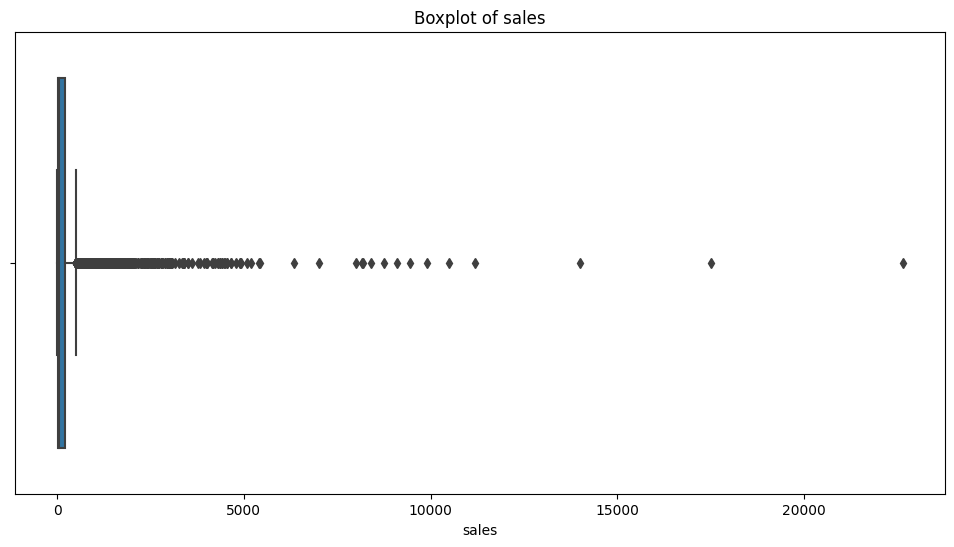

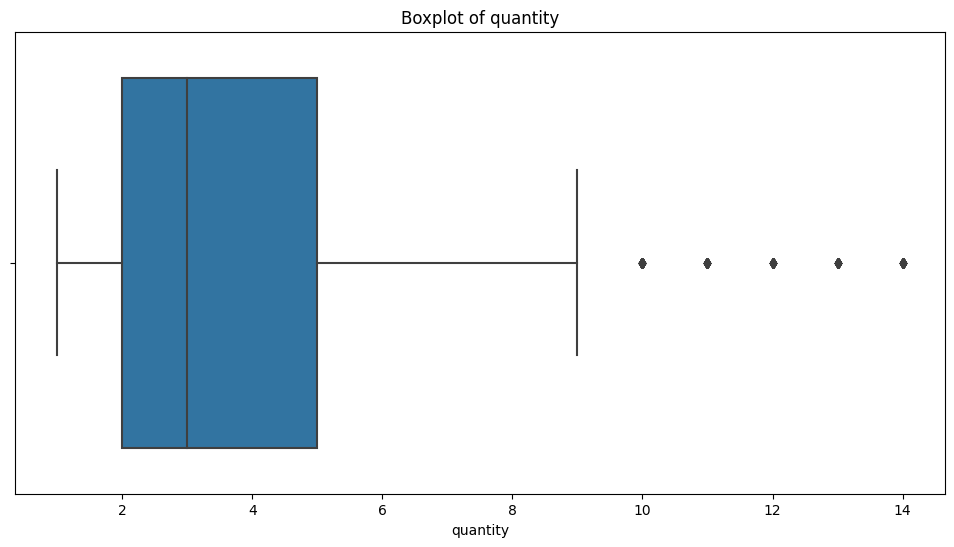

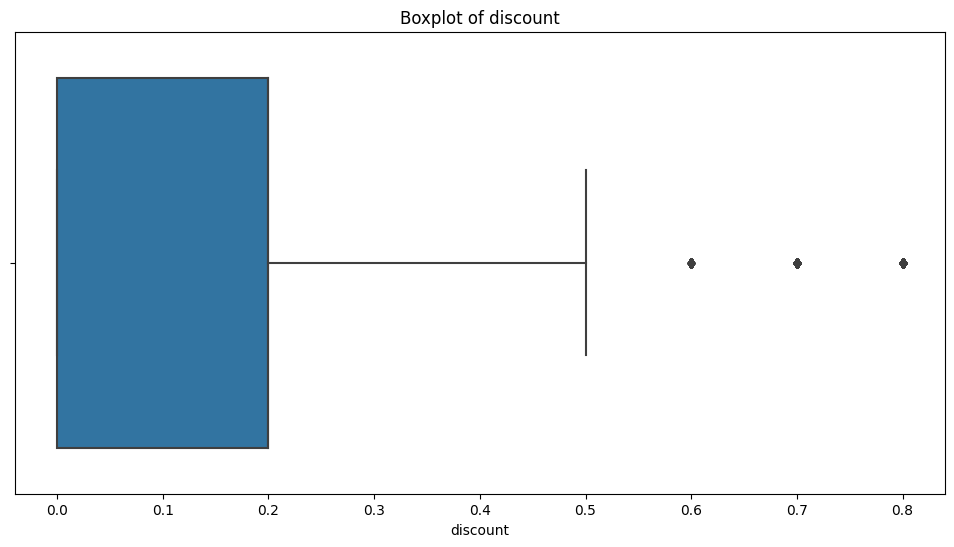

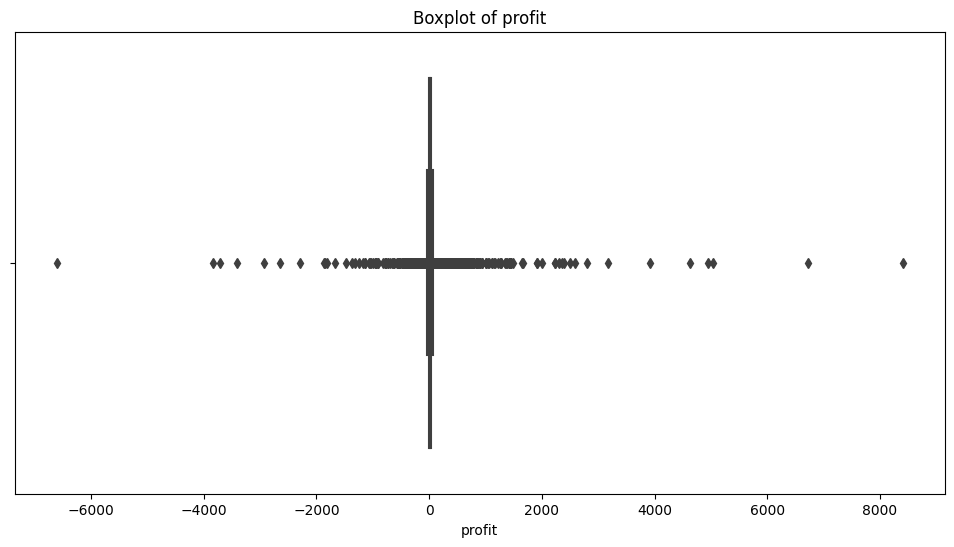

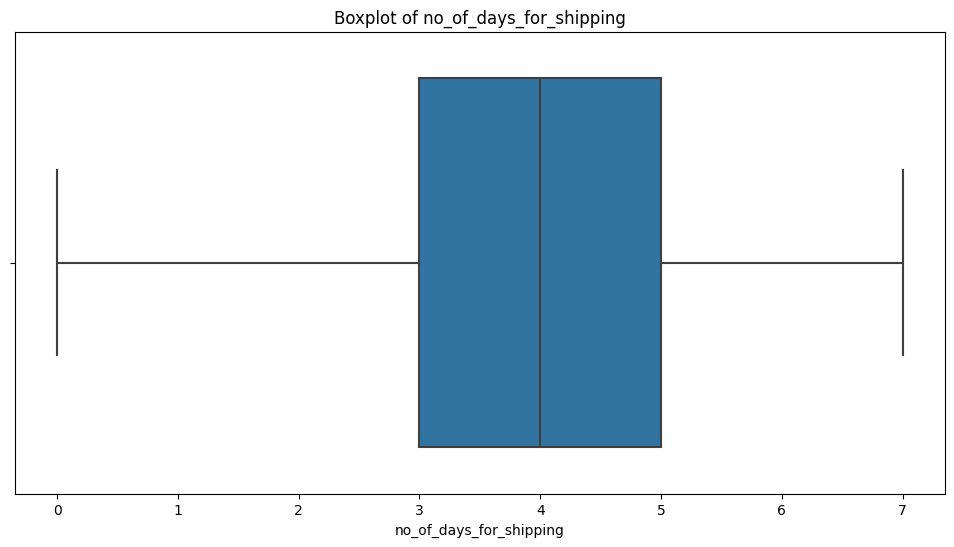

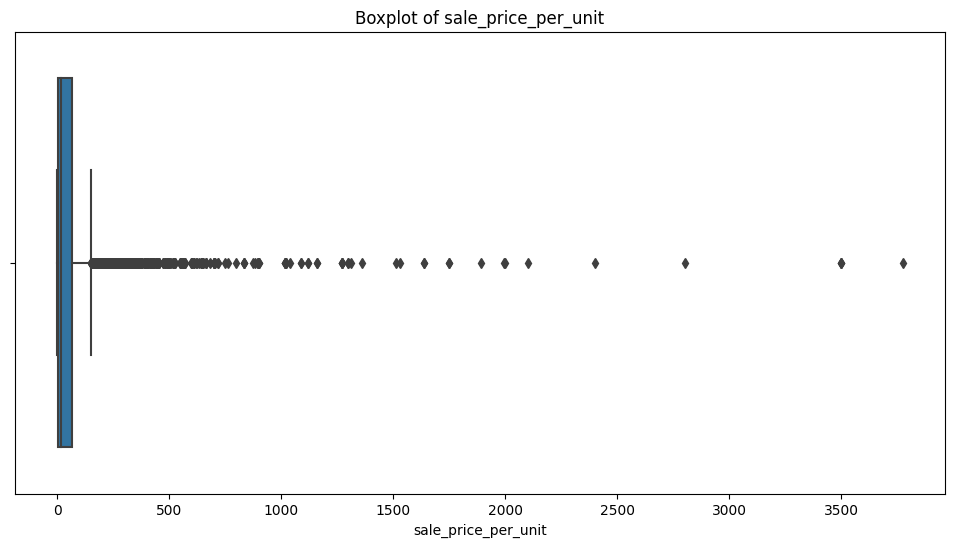

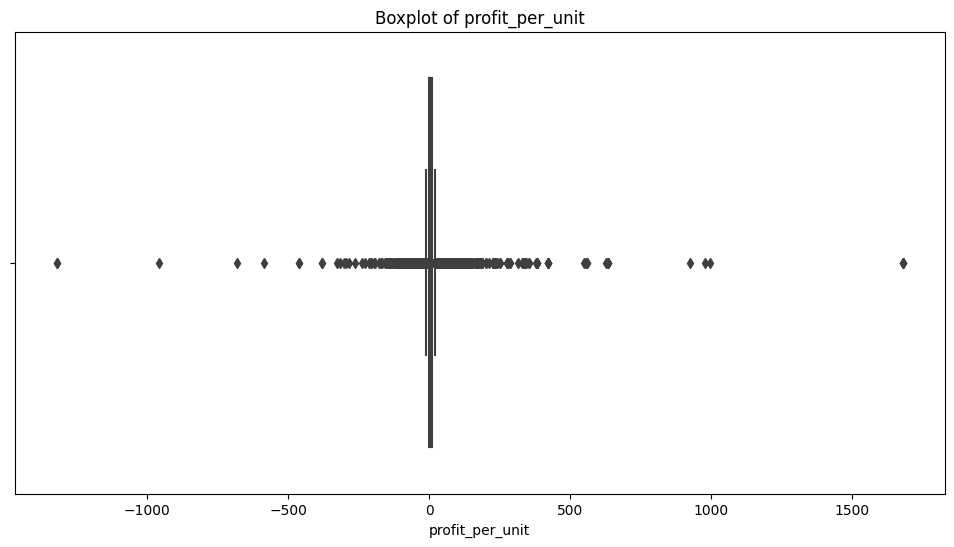

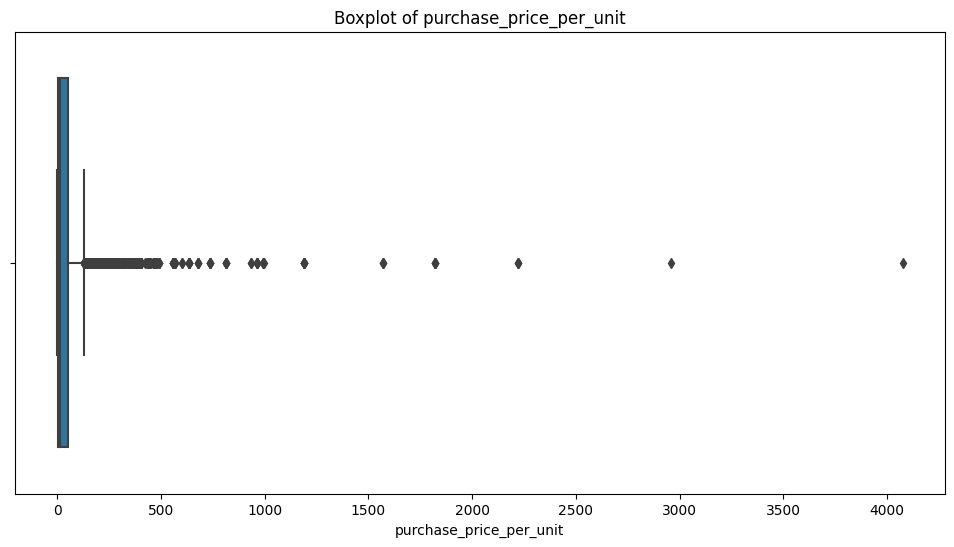

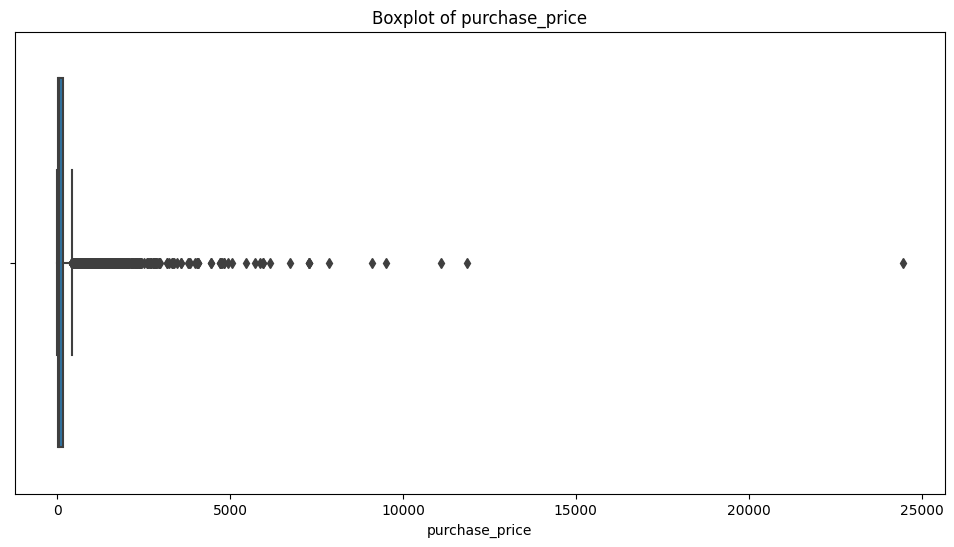

In [19]:
# Select only numeric types
numeric_df = df.select_dtypes(include='number')

# Create a box plot for each numeric column
for column in numeric_df.columns:
    plt.figure(figsize=(12, 6))
    sns.boxplot(x=numeric_df[column])
    plt.title(f'Boxplot of {column}')
    plt.show()


## Correlation matrix
#### It only describe the relationship between variables 
#### A correlation coefficient is a value between -1 and 1, inclusive.
####  Where , co-efficient of 1 represents  the +ve linear relation 
#### co-efficient of -1 represents  the -ve linear relation
#### co-efficient of 0 indicates no linear relation



In [20]:
pd.set_option('display.float_format', '{:.5f}'.format)

df.select_dtypes(include=[np.number]).corr() # Corelation only for numeric data

,sales,quantity,discount,profit,no_of_days_for_shipping,sale_price_per_unit,profit_per_unit,purchase_price_per_unit,purchase_price
sales,1.00000,0.20079,-0.02819,0.47906,-0.00735,0.88941,0.44732,0.83471,0.92774
quantity,0.20079,1.00000,0.00862,0.06625,0.01830,-0.00295,-0.00721,-0.00015,0.19901
discount,-0.02819,0.00862,1.00000,-0.21949,0.00041,-0.03332,-0.23231,0.06760,0.06107
profit,0.47906,0.06625,-0.21949,1.00000,-0.00465,0.46840,0.91220,0.12922,0.11684
no_of_days_for_shipping,-0.00735,0.01830,0.00041,-0.00465,1.00000,-0.01339,-0.00419,-0.01373,-0.00634
sale_price_per_unit,0.88941,-0.00295,-0.03332,0.46840,-0.01339,1.00000,0.53832,0.92226,0.80715
profit_per_unit,0.44732,-0.00721,-0.23231,0.91220,-0.00419,0.53832,1.00000,0.17070,0.11827
purchase_price_per_unit,0.83471,-0.00015,0.06760,0.12922,-0.01373,0.92226,0.17070,1.00000,0.88947
purchase_price,0.92774,0.19901,0.06107,0.11684,-0.00634,0.80715,0.11827,0.88947,1.00000


## Covariance matrix
#### Covariance quantifies how much two random variables change together.


In [21]:
pd.set_option('display.float_format', '{:.5f}'.format) # Adjust display settings 
df.select_dtypes(include=[np.number]).cov()


,sales,quantity,discount,profit,no_of_days_for_shipping,sale_price_per_unit,profit_per_unit,purchase_price_per_unit,purchase_price
sales,388434.45531,278.45992,-3.62723,69944.09659,-8.00920,79229.22652,15633.12236,63596.10416,318493.98595
quantity,278.45992,4.95111,0.00396,34.53477,0.07115,-0.93979,-0.89949,-0.04030,243.92119
discount,-3.62723,0.00396,0.04262,-10.61517,0.00015,-0.98335,-2.68943,1.70608,6.94532
profit,69944.09659,34.53477,-10.61517,54877.79806,-1.90338,15683.22680,11982.76713,3700.45968,15076.91370
no_of_days_for_shipping,-8.00920,0.07115,0.00015,-1.90338,3.05399,-3.34353,-0.41043,-2.93310,-6.10597
sale_price_per_unit,79229.22652,-0.93979,-0.98335,15683.22680,-3.34353,20429.02571,4314.55447,16114.47124,63546.98307
profit_per_unit,15633.12236,-0.89949,-2.68943,11982.76713,-0.41043,4314.55447,3144.40267,1170.15180,3653.04467
purchase_price_per_unit,63596.10416,-0.04030,1.70608,3700.45968,-2.93310,16114.47124,1170.15180,14944.31943,59893.93840
purchase_price,318493.98595,243.92119,6.94532,15076.91370,-6.10597,63546.98307,3653.04467,59893.93840,303410.12693


#Some of the main points of the above Covariance matrix
`sales` and `profit` : The +ve covariance(69,944.09659) indicates, if sales increase then profit also increase and vice versa 

`sales` and `discount` : The -ve covaraiance (-3.62723) indicates the inverse relationship between two variables

`discount` and `profit` : The -ve covaraiance (-10.61517) indicates the inverse relationship between two variables


In [22]:
# create year , month and year & month
df['year'] = df['ship_date'].dt.year  #extract the year from the ship date
df['month'] = df['ship_date'].dt.month #extract the month from the ship date
df['month_name'] = df['ship_date'].dt.strftime('%B') #extract the month name from the ship date


In [23]:
df.head()

,row_id,order_id,order_date,ship_date,ship_mode,customer_id,customer_name,segment,city,state,...,profit,no_of_days_for_shipping,sale_price_per_unit,profit_per_unit,purchase_price_per_unit,purchase_price,weekday_string,year,month,month_name
0,1,CA-2016-152156,2016-11-08,2016-11-11,Second Class,CG-12520,Claire Gute,Consumer,Henderson,Kentucky,...,41.91360,3,130.98000,20.95680,110.02320,220.04640,Friday,2016,11,November
1,2,CA-2016-152156,2016-11-08,2016-11-11,Second Class,CG-12520,Claire Gute,Consumer,Henderson,Kentucky,...,219.58200,3,243.98000,73.19400,170.78600,512.35800,Friday,2016,11,November
2,3,CA-2016-138688,2016-06-12,2016-06-16,Second Class,DV-13045,Darrin Van Huff,Corporate,Los Angeles,California,...,6.87140,4,7.31000,3.43570,3.87430,7.74860,Thursday,2016,6,June
3,4,US-2015-108966,2015-10-11,2015-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,Fort Lauderdale,Florida,...,-383.03100,7,191.42550,-76.60620,268.03170,1340.15850,Sunday,2015,10,October
4,5,US-2015-108966,2015-10-11,2015-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,Fort Lauderdale,Florida,...,2.51640,7,11.08400,1.25820,9.82580,19.65160,Sunday,2015,10,October


In [24]:
# Calculate the yearly Sales
yearly_sales = df.groupby('year')['sales'].sum()


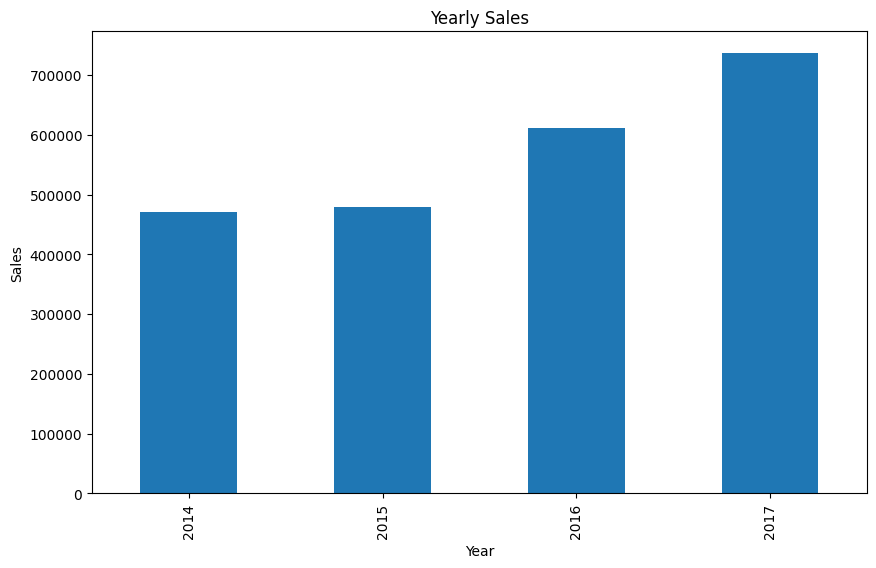

In [25]:
# Create the yearly plot for the sales ammount 
plt.figure(figsize=(10, 6))
yearly_sales.plot(kind='bar')

# Add a title and labels
plt.title('Yearly Sales')
plt.xlabel('Year')
plt.ylabel('Sales')

# Show the plot
plt.show()


In [26]:
# Create the yearly plot for the sales ammount 

# Format values to two decimal places
formatted_values = ['{:,.2f}'.format(val) for val in yearly_sales.values]

fig = px.bar(yearly_sales,
             x=yearly_sales.index,
             y=yearly_sales.values,
             text=formatted_values,
             orientation='v', title='Yearly Sales')

fig.update_layout(xaxis_title="Year",
                  yaxis_title="Sales",
                  bargap=0.1 # gap between bars of adjacent location coordinates.
                  )

fig.show()

# The above graph shows that sales are increasing yearly

In [27]:
# Monthly Sales Over the year

df['month_year'] = df['ship_date'].dt.to_period('M')
df['month_year']=df['month_year'].astype(str)
monthly_sales = df.groupby('month_year')['sales'].sum()


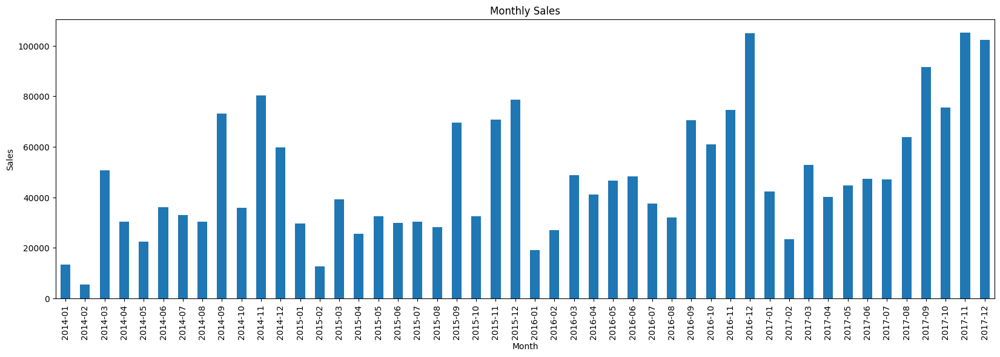

In [28]:
# Create the Monthly sales plot 
plt.figure(figsize=(20, 6))

monthly_sales.plot(kind='bar')

# Add a title and labels
plt.title('Monthly Sales')
plt.xlabel('Month')
plt.ylabel('Sales')

# Show the plot
plt.show()


In [29]:

# Format values to two decimal places
formatted_values = ['{:,.2f}'.format(val) for val in monthly_sales.values]

fig = px.bar(monthly_sales,
             x=monthly_sales.index,
             y=monthly_sales.values,
             text=formatted_values,
             orientation='v', title='Monthly Sales For The Year 2014 To 2017')

# Set figure size
fig.update_layout(autosize=False, width=1400, height=900,
                  xaxis_title="Month",
                  yaxis_title="Sales",
                  xaxis_tickangle=-90  # Rotate x-axis label
                  )
fig.show()


In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9994 entries, 0 to 9993
Data columns (total 30 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   row_id                   9994 non-null   object        
 1   order_id                 9994 non-null   object        
 2   order_date               9994 non-null   datetime64[ns]
 3   ship_date                9994 non-null   datetime64[ns]
 4   ship_mode                9994 non-null   object        
 5   customer_id              9994 non-null   object        
 6   customer_name            9994 non-null   object        
 7   segment                  9994 non-null   object        
 8   city                     9994 non-null   object        
 9   state                    9994 non-null   object        
 10  postal_code              9994 non-null   object        
 11  region                   9994 non-null   object        
 12  product_id               9994 non-

In [31]:
#Location 
# a.)	We will compare the profit/loss generated between different locations.

location_profit = df.groupby(['city' , 'postal_code'])['profit'].sum()
top10_locations = location_profit.sort_values(ascending=False).head(10)
print(top10_locations)


city           postal_code
New York City  10024         21653.72480
               10035         16533.86690
               10009         13697.00190
Seattle        98115         13303.87550
New York City  10011         10152.39010
Lafayette      47905          8976.09730
Seattle        98105          8734.60420
Newark         19711          8086.17150
Detroit        48205          7994.52630
Los Angeles    90049          7793.11450
Name: profit, dtype: float64


In [32]:
bottom10_locations = location_profit.sort_values(ascending=True).head(10)
print(bottom10_locations)

city          postal_code
San Antonio   78207         -7299.05020
Lancaster     43130         -7149.61800
Burlington    27217         -5894.52690
Chicago       60653         -5678.79820
Philadelphia  19140         -5168.39050
Houston       77095         -4447.33230
Philadelphia  19143         -3830.74580
              19134         -3745.85520
Louisville    80027         -3406.20950
Phoenix       85023         -2790.88320
Name: profit, dtype: float64


In [33]:
#Location 
# b)	We will analyze the number of customers who visited and purchased from different locations.




In [34]:
#Customers: 
#a)	To find out the regularly visited customers. 




In [35]:
#Customers: 
#b)	Which customers are buying more in terms of dollar value?

In [36]:
#Customers: 
#c)	Which customers are more profitable?

customer_profit = df.groupby(['customer_id' , 'customer_name'])['profit'].sum()
top10_customers = customer_profit.sort_values(ascending=False).head(10)
#Top10Customers.columns = ['Customer ID' , 'Customer Name' , 'Profit']
print(top10_customers)


customer_id  customer_name       
TC-20980     Tamara Chand           8981.32390
RB-19360     Raymond Buch           6976.09590
SC-20095     Sanjit Chand           5757.41190
HL-15040     Hunter Lopez           5622.42920
AB-10105     Adrian Barton          5444.80550
TA-21385     Tom Ashbrook           4703.78830
CM-12385     Christopher Martinez   3899.89040
KD-16495     Keith Dawkins          3038.62540
AR-10540     Andy Reiter            2884.62080
DR-12940     Daniel Raglin          2869.07600
Name: profit, dtype: float64


In [37]:
bottom10_customers = customer_profit.sort_values(ascending=True).head(10)
print(bottom10_customers)

customer_id  customer_name   
CS-12505     Cindy Stewart      -6626.38950
GT-14635     Grant Thornton     -4108.65890
LF-17185     Luke Foster        -3583.97700
SR-20425     Sharelle Roach     -3333.91440
HG-14965     Henry Goldwyn      -2797.96350
NC-18415     Nathan Cano        -2204.80720
SB-20290     Sean Braxton       -2082.74510
SM-20320     Sean Miller        -1980.73930
CP-12340     Christine Phan     -1850.30290
NF-18385     Natalie Fritzler   -1695.97140
Name: profit, dtype: float64


In [38]:
#Time Factor:
#a.)	Impact of sales on weekends
day_profit = df.groupby('weekday_string')['profit'].sum()
top10_products = day_profit.sort_values(ascending=False).head(7)
print(top10_products)
#WeekdayCount           = df['WeekdayString'].value_counts().sort_index()
day_count           = df['weekday_string'].value_counts()
print(day_count)

days_analysis = pd.concat([top10_products,day_count],axis=1)
days_analysis.columns = ['Profit' , 'Count']

print(days_analysis)



weekday_string
Sunday      54646.15230
Wednesday   49758.23510
Saturday    45162.74310
Tuesday     43869.81580
Friday      39696.23750
Thursday    29388.52880
Monday      23875.30910
Name: profit, dtype: float64
Wednesday    1593
Tuesday      1566
Friday       1562
Saturday     1429
Thursday     1415
Monday       1241
Sunday       1188
Name: weekday_string, dtype: int64
               Profit  Count
Sunday    54646.15230   1188
Wednesday 49758.23510   1593
Saturday  45162.74310   1429
Tuesday   43869.81580   1566
Friday    39696.23750   1562
Thursday  29388.52880   1415
Monday    23875.30910   1241


In [39]:
#Time Factor:
#b)	Result of sales during the holiday season.



In [40]:
#Products: 
#a)	Find out the profit/loss of the products.
product_profit = df.groupby('product_name')['profit'].sum()
top10_products = product_profit.sort_values(ascending=False).head(10)
print(top10_products)


product_name
Canon imageCLASS 2200 Advanced Copier                                         25199.92800
Fellowes PB500 Electric Punch Plastic Comb Binding Machine with Manual Bind    7753.03900
Hewlett Packard LaserJet 3310 Copier                                           6983.88360
Canon PC1060 Personal Laser Copier                                             4570.93470
HP Designjet T520 Inkjet Large Format Printer - 24" Color                      4094.97660
Ativa V4110MDD Micro-Cut Shredder                                              3772.94610
3D Systems Cube Printer, 2nd Generation, Magenta                               3717.97140
Plantronics Savi W720 Multi-Device Wireless Headset System                     3696.28200
Ibico EPK-21 Electric Binding System                                           3345.28230
Zebra ZM400 Thermal Label Printer                                              3343.53600
Name: profit, dtype: float64


In [41]:
#ProductLoss = df.groupby('Product Name')['Profit'].sum()
bottom10_products = product_profit.sort_values(ascending=True).head(10)
print(bottom10_products)

product_name
Cubify CubeX 3D Printer Double Head Print                           -8879.97040
Lexmark MX611dhe Monochrome Laser Printer                           -4589.97300
Cubify CubeX 3D Printer Triple Head Print                           -3839.99040
Chromcraft Bull-Nose Wood Oval Conference Tables & Bases            -2876.11560
Bush Advantage Collection Racetrack Conference Table                -1934.39760
GBC DocuBind P400 Electric Binding System                           -1878.16620
Cisco TelePresence System EX90 Videoconferencing Unit               -1811.07840
Martin Yale Chadless Opener Electric Letter Opener                  -1299.18360
Balt Solid Wood Round Tables                                        -1201.05810
BoxOffice By Design Rectangular and Half-Moon Meeting Room Tables   -1148.43750
Name: profit, dtype: float64


In [42]:
#Products: 
#b.)	Find out the profit/loss margin of the products.


In [43]:
#Forecast (Time Series Analysis):
#a.	Based on the data and certain assumptions, we are trying to do the forecast/budgeting for the following year.


In [44]:
shipping_days_count           = df['no_of_days_for_shipping'].value_counts().sort_index()
shipping_days_count_percentage = df['no_of_days_for_shipping'].value_counts(normalize=True).sort_index() * 100

days_analysis = pd.concat([shipping_days_count,shipping_days_count_percentage],axis=1)
days_analysis.columns = ['Count' , 'Percentage']

print(days_analysis)

   Count  Percentage
0    519     5.19312
1    369     3.69222
2   1334    13.34801
3   1005    10.05603
4   2774    27.75665
5   2169    21.70302
6   1203    12.03722
7    621     6.21373


In [45]:
df.drop(columns=['row_id', 'postal_code','month_year'],inplace=True)


In [46]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9994 entries, 0 to 9993
Data columns (total 27 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   order_id                 9994 non-null   object        
 1   order_date               9994 non-null   datetime64[ns]
 2   ship_date                9994 non-null   datetime64[ns]
 3   ship_mode                9994 non-null   object        
 4   customer_id              9994 non-null   object        
 5   customer_name            9994 non-null   object        
 6   segment                  9994 non-null   object        
 7   city                     9994 non-null   object        
 8   state                    9994 non-null   object        
 9   region                   9994 non-null   object        
 10  product_id               9994 non-null   object        
 11  category                 9994 non-null   object        
 12  sub-category             9994 non-

# **Univariate Analysis**


Column: order_date
2016-09-05    38
2017-09-02    36
2016-11-10    35
2017-12-01    34
2017-12-02    34
              ..
2016-02-25     1
2016-10-25     1
2014-02-21     1
2016-10-18     1
2014-01-21     1
Name: order_date, Length: 1237, dtype: int64


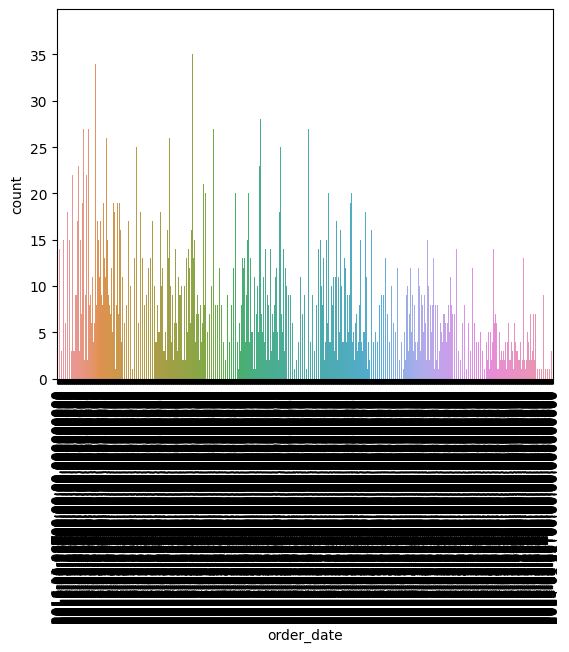

Column: ship_date
2017-12-31    48
2015-12-16    35
2017-09-26    34
2017-12-06    32
2017-11-21    32
              ..
2015-02-20     1
2017-01-10     1
2015-07-30     1
2016-06-05     1
2017-02-11     1
Name: ship_date, Length: 1329, dtype: int64


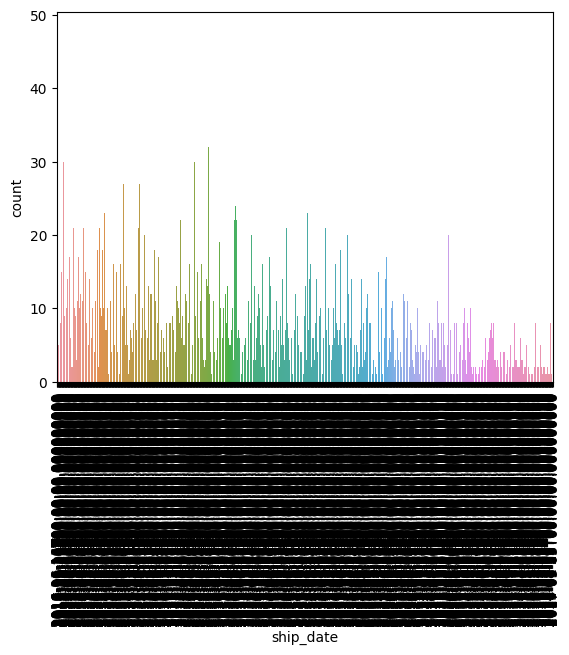

Column: ship_mode
Standard Class    5968
Second Class      1945
First Class       1538
Same Day           543
Name: ship_mode, dtype: int64


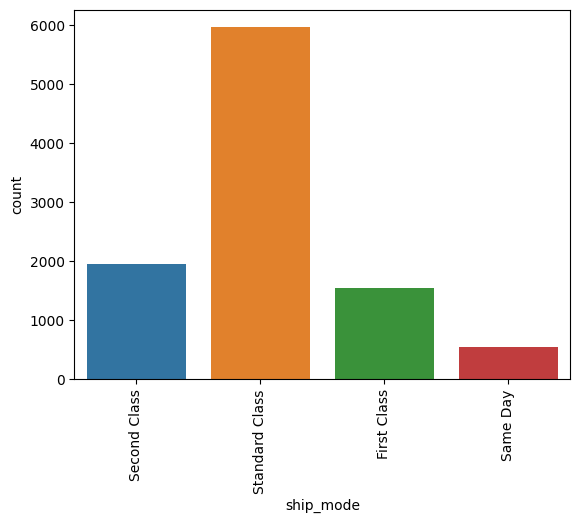

Column: segment
Consumer       5191
Corporate      3020
Home Office    1783
Name: segment, dtype: int64


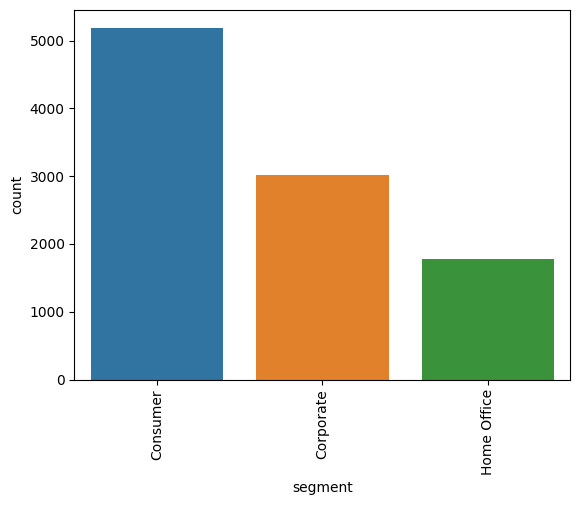

Column: state
California              2001
New York                1128
Texas                    985
Pennsylvania             587
Washington               506
Illinois                 492
Ohio                     469
Florida                  383
Michigan                 255
North Carolina           249
Arizona                  224
Virginia                 224
Georgia                  184
Tennessee                183
Colorado                 182
Indiana                  149
Kentucky                 139
Massachusetts            135
New Jersey               130
Oregon                   124
Wisconsin                110
Maryland                 105
Delaware                  96
Minnesota                 89
Connecticut               82
Oklahoma                  66
Missouri                  66
Alabama                   61
Arkansas                  60
Rhode Island              56
Utah                      53
Mississippi               53
Louisiana                 42
South Carolina            42


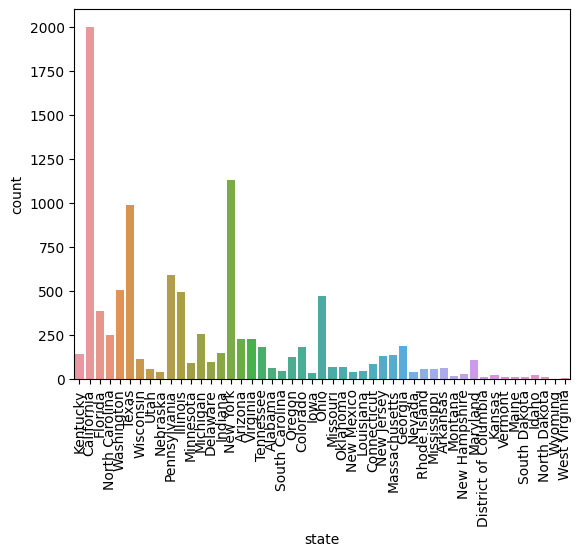

Column: region
West       3203
East       2848
Central    2323
South      1620
Name: region, dtype: int64


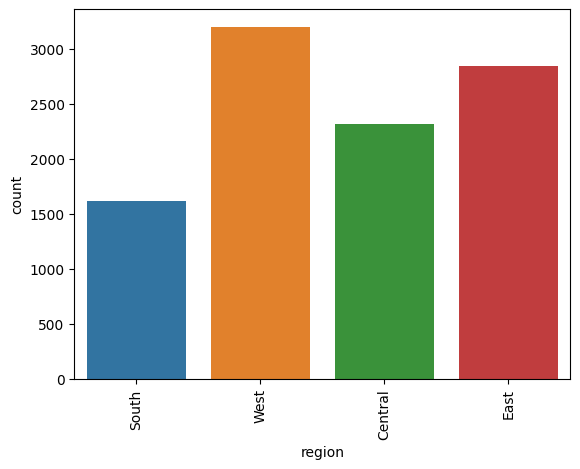

Column: category
Office Supplies    6026
Furniture          2121
Technology         1847
Name: category, dtype: int64


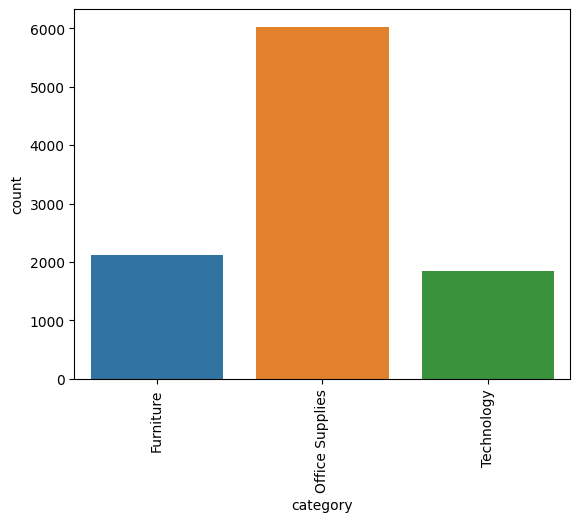

Column: sub-category
Binders        1523
Paper          1370
Furnishings     957
Phones          889
Storage         846
Art             796
Accessories     775
Chairs          617
Appliances      466
Labels          364
Tables          319
Envelopes       254
Bookcases       228
Fasteners       217
Supplies        190
Machines        115
Copiers          68
Name: sub-category, dtype: int64


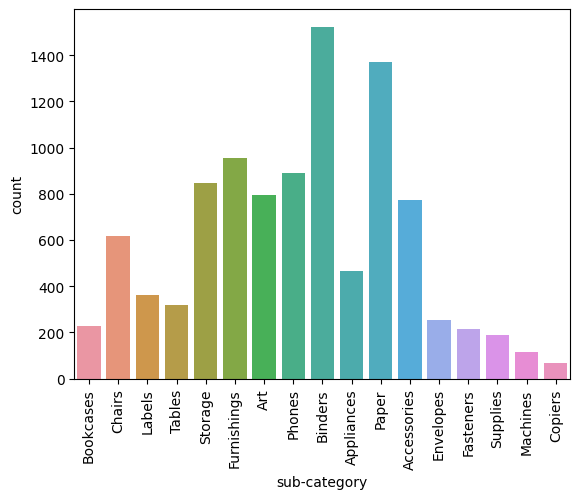

Column: sales
count    9994.00000
mean      229.85800
std       623.24510
min         0.44400
25%        17.28000
50%        54.49000
75%       209.94000
max     22638.48000
Name: sales, dtype: float64


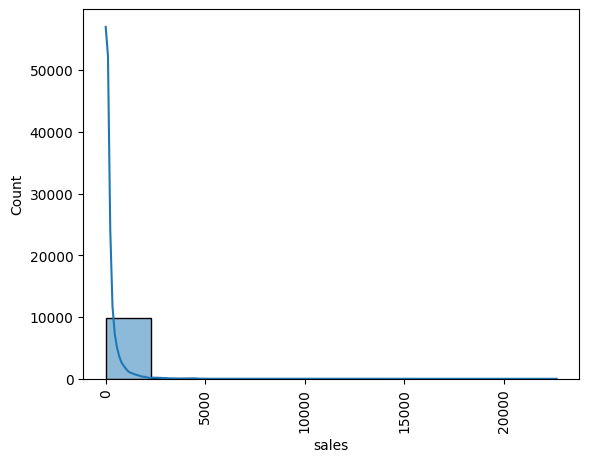

Column: quantity
count   9994.00000
mean       3.78957
std        2.22511
min        1.00000
25%        2.00000
50%        3.00000
75%        5.00000
max       14.00000
Name: quantity, dtype: float64


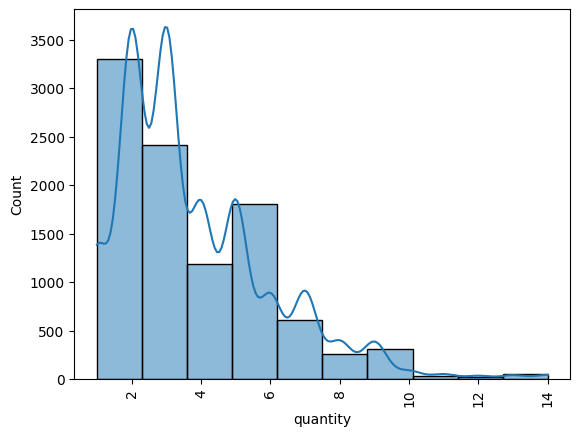

Column: discount
count   9994.00000
mean       0.15620
std        0.20645
min        0.00000
25%        0.00000
50%        0.20000
75%        0.20000
max        0.80000
Name: discount, dtype: float64


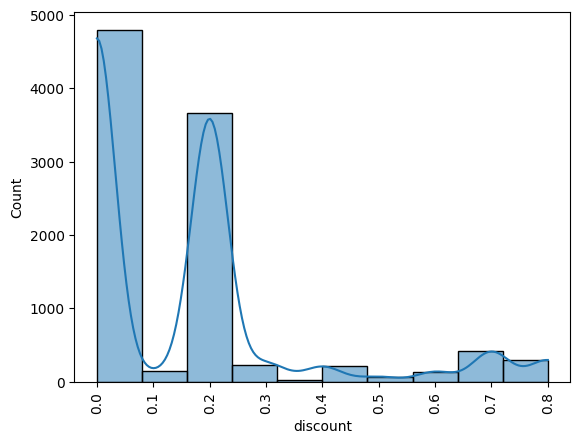

Column: profit
count    9994.00000
mean       28.65690
std       234.26011
min     -6599.97800
25%         1.72875
50%         8.66650
75%        29.36400
max      8399.97600
Name: profit, dtype: float64


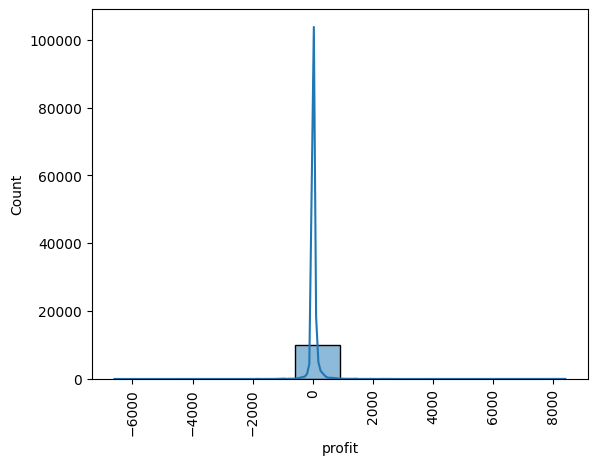

Column: no_of_days_for_shipping
count   9994.00000
mean       3.95817
std        1.74757
min        0.00000
25%        3.00000
50%        4.00000
75%        5.00000
max        7.00000
Name: no_of_days_for_shipping, dtype: float64


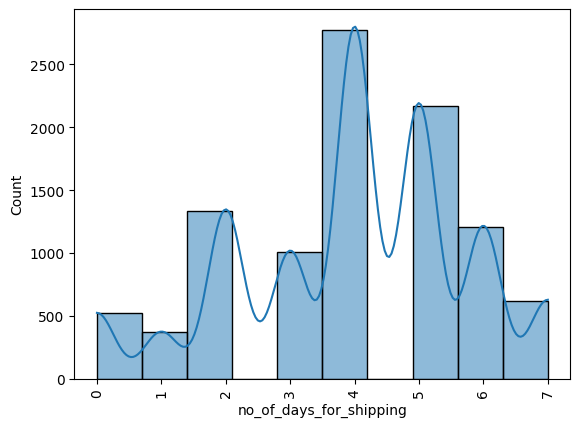

Column: sale_price_per_unit
count   9994.00000
mean      60.86212
std      142.93014
min       -0.35600
25%        5.40200
50%       16.23600
75%       63.88450
max     3772.99667
Name: sale_price_per_unit, dtype: float64


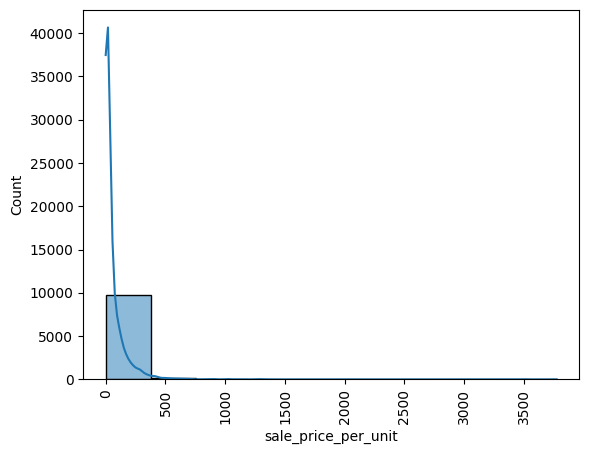

Column: profit_per_unit
count    9994.00000
mean        7.79937
std        56.07497
min     -1319.99560
25%         0.72280
50%         2.76700
75%         8.70320
max      1679.99520
Name: profit_per_unit, dtype: float64


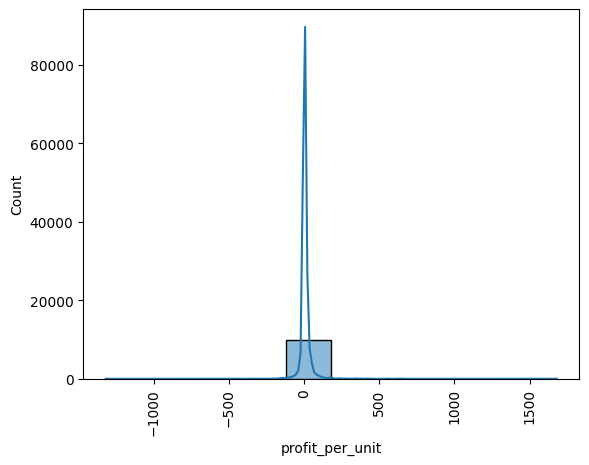

Column: purchase_price_per_unit
count   9994.00000
mean      53.06275
std      122.24696
min        0.45440
25%        3.43240
50%       12.78590
75%       54.52200
max     4074.84307
Name: purchase_price_per_unit, dtype: float64


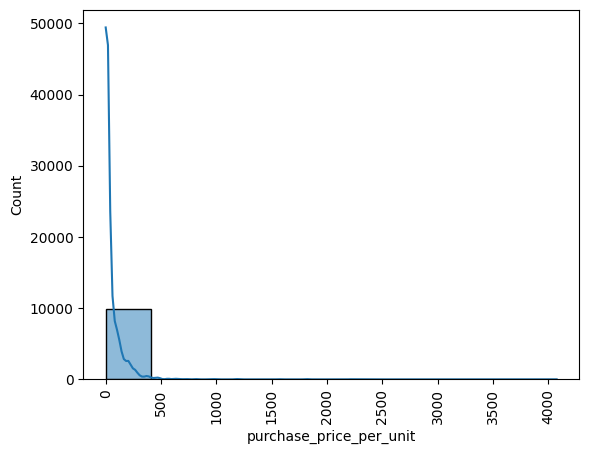

Column: purchase_price
count    9994.00000
mean      201.04490
std       550.82677
min         0.55440
25%        12.49670
50%        41.57700
75%       181.90950
max     24449.05840
Name: purchase_price, dtype: float64


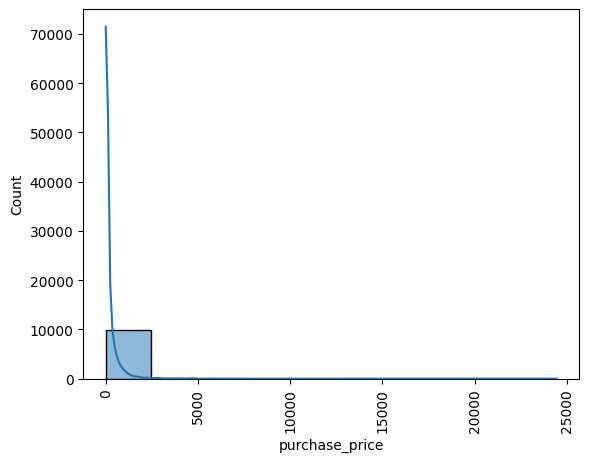

Column: weekday_string
Wednesday    1593
Tuesday      1566
Friday       1562
Saturday     1429
Thursday     1415
Monday       1241
Sunday       1188
Name: weekday_string, dtype: int64


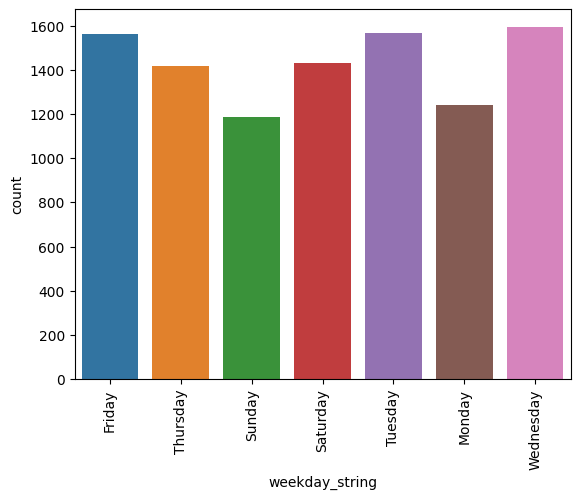

Column: year
count   9994.00000
mean    2015.73324
std        1.11954
min     2014.00000
25%     2015.00000
50%     2016.00000
75%     2017.00000
max     2017.00000
Name: year, dtype: float64


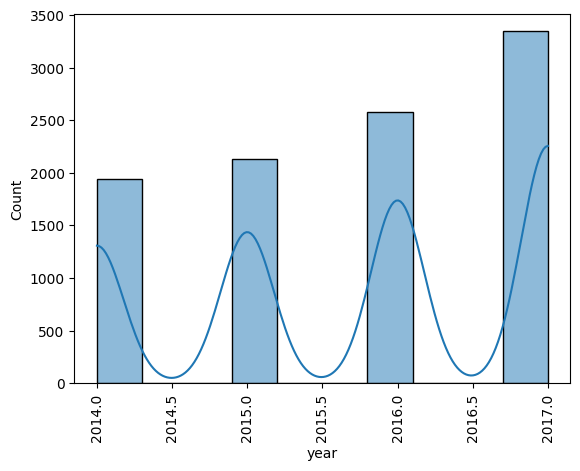

Column: month
count   9994.00000
mean       7.78937
std        3.32290
min        1.00000
25%        5.00000
50%        9.00000
75%       11.00000
max       12.00000
Name: month, dtype: float64


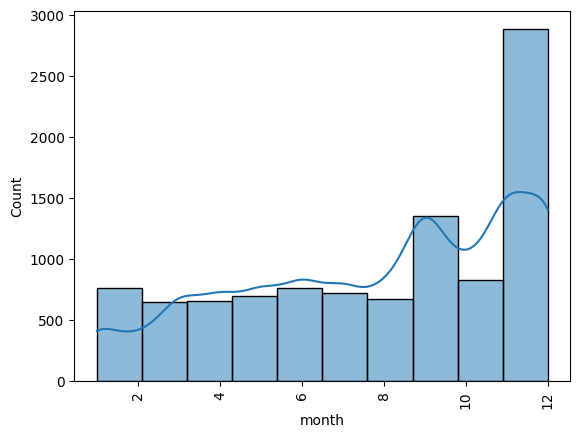

Column: month_name
December     1449
November     1436
September    1356
October       831
June          764
July          721
May           694
August        674
April         653
March         652
January       440
February      324
Name: month_name, dtype: int64


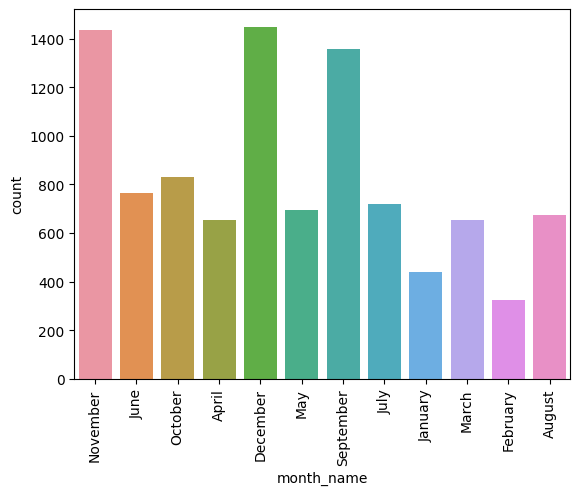

In [47]:
#plt.figure(figsize=(20, 20))

# List of columns to exclude
exclude_columns = ['order_id', 'customer_id','customer_name','city','product_id','product_name']

for column in df.columns:
    if column not in exclude_columns:
        if df[column].dtype in ['int64', 'float64']:
            print(f"Column: {column}")
            print(df[column].describe())
            sns.histplot(df[column], bins=10, kde=True)
        else:
            print(f"Column: {column}")
            print(df[column].value_counts())
            sns.countplot(x=column, data=df)
        plt.xticks(rotation=90)  # Add this line to rotate x-axis labels    
        plt.show()


# **Bivariate Analysis**

#### 1. Numerical Vs Numerical

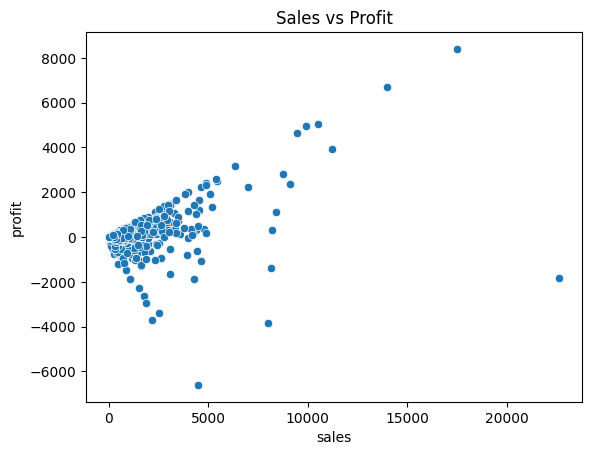

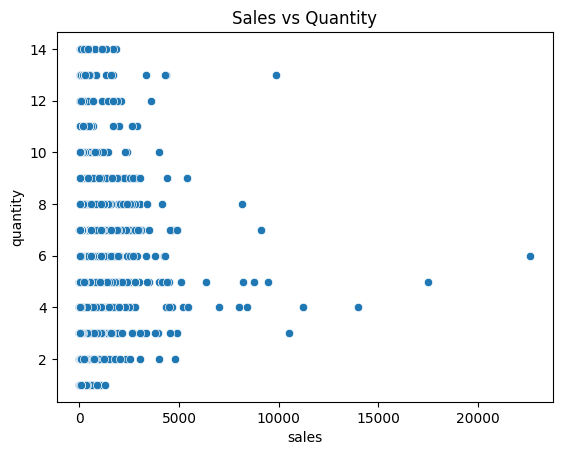

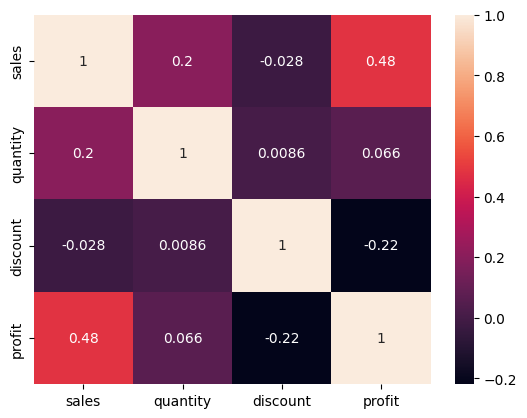

In [48]:
# Scatter plots
sns.scatterplot(data=df, x='sales', y='profit')
plt.title('Sales vs Profit')
plt.show()

sns.scatterplot(data=df, x='sales', y='quantity')
plt.title('Sales vs Quantity')
plt.show()

# Correlation matrix
numerical_data = df[['sales', 'quantity', 'discount', 'profit']]
corr = numerical_data.corr()
sns.heatmap(corr, annot=True)
plt.show()


#### 2. Categorical Vs Numerical



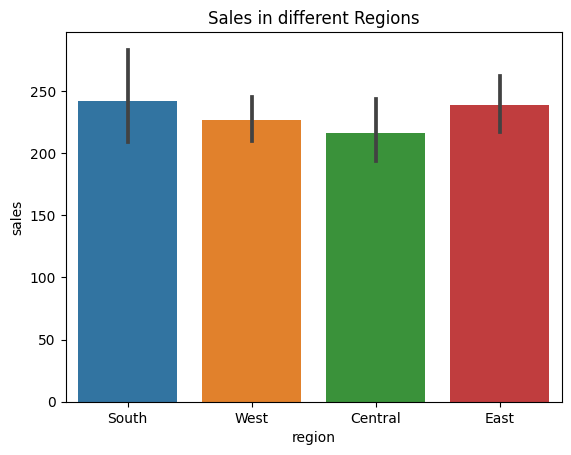

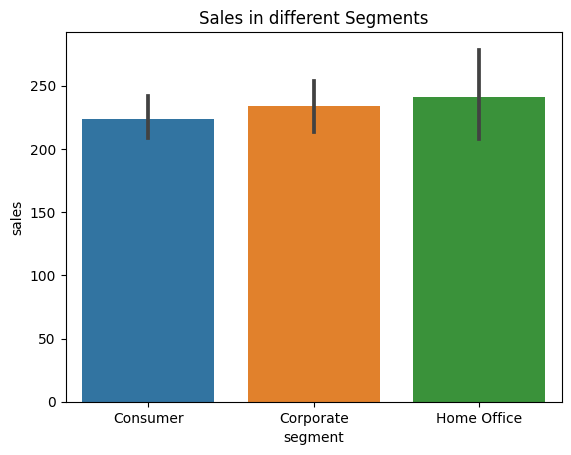

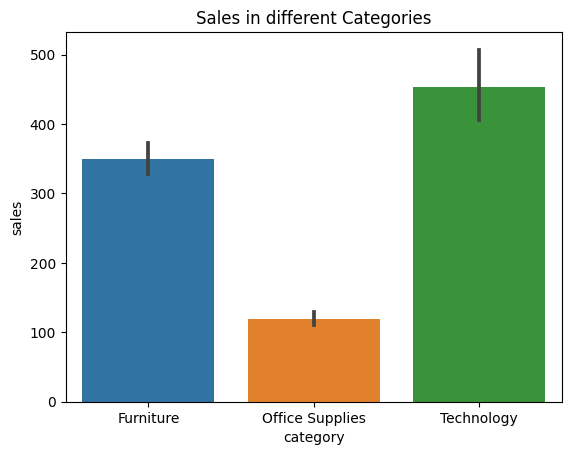

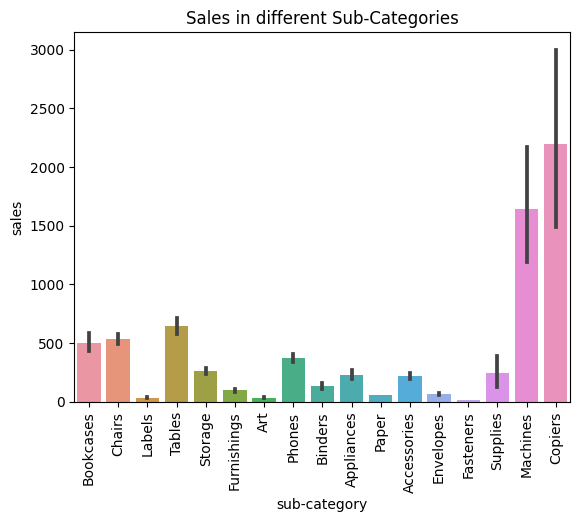

In [49]:
sns.barplot(data=df, x='region', y='sales')
plt.title('Sales in different Regions')
plt.show()

sns.barplot(data=df, x='segment', y='sales')
plt.title('Sales in different Segments')
plt.show()

sns.barplot(data=df, x='category', y='sales')
plt.title('Sales in different Categories')
plt.show()

sns.barplot(data=df, x='sub-category', y='sales')
plt.title('Sales in different Sub-Categories')
plt.xticks(rotation=90)
plt.show()


#### 3. Categorical Vs Categorical


In [50]:
cross_tab = pd.crosstab(df['region'], df['category'])
print(cross_tab)

cross_tab = pd.crosstab(df['segment'], df['category'])
print(cross_tab)


category  Furniture  Office Supplies  Technology
region                                          
Central         481             1422         420
East            601             1712         535
South           332              995         293
West            707             1897         599
category     Furniture  Office Supplies  Technology
segment                                            
Consumer          1113             3127         951
Corporate          646             1820         554
Home Office        362             1079         342


# **Multivariate Analysis**

/tmp/ipykernel_29938/1988375328.py:3: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



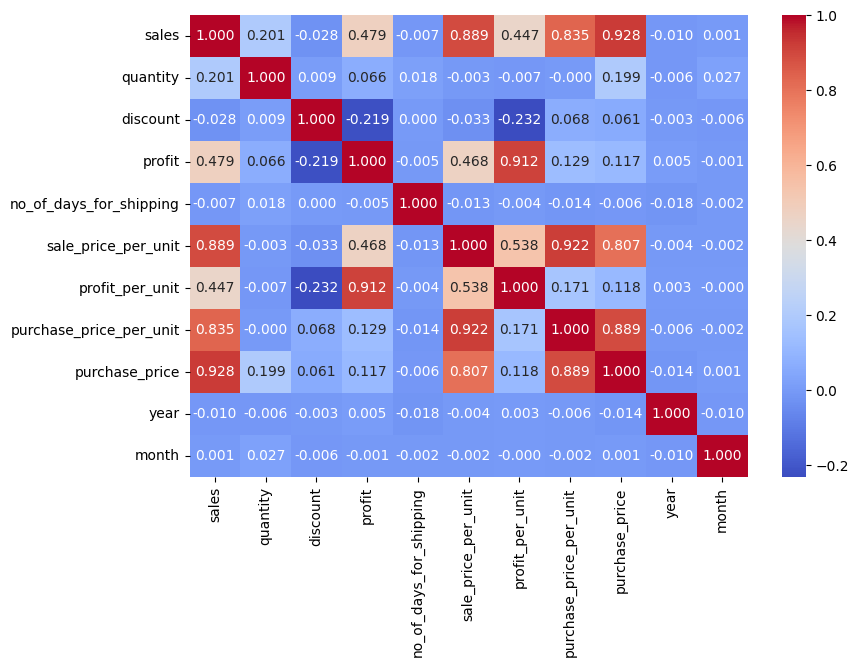

In [51]:
# a) Corelation Matrix 
plt.figure(figsize=(9, 6))  # Adjust the plot size 
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, fmt=".3f" , cmap='coolwarm')
plt.show()


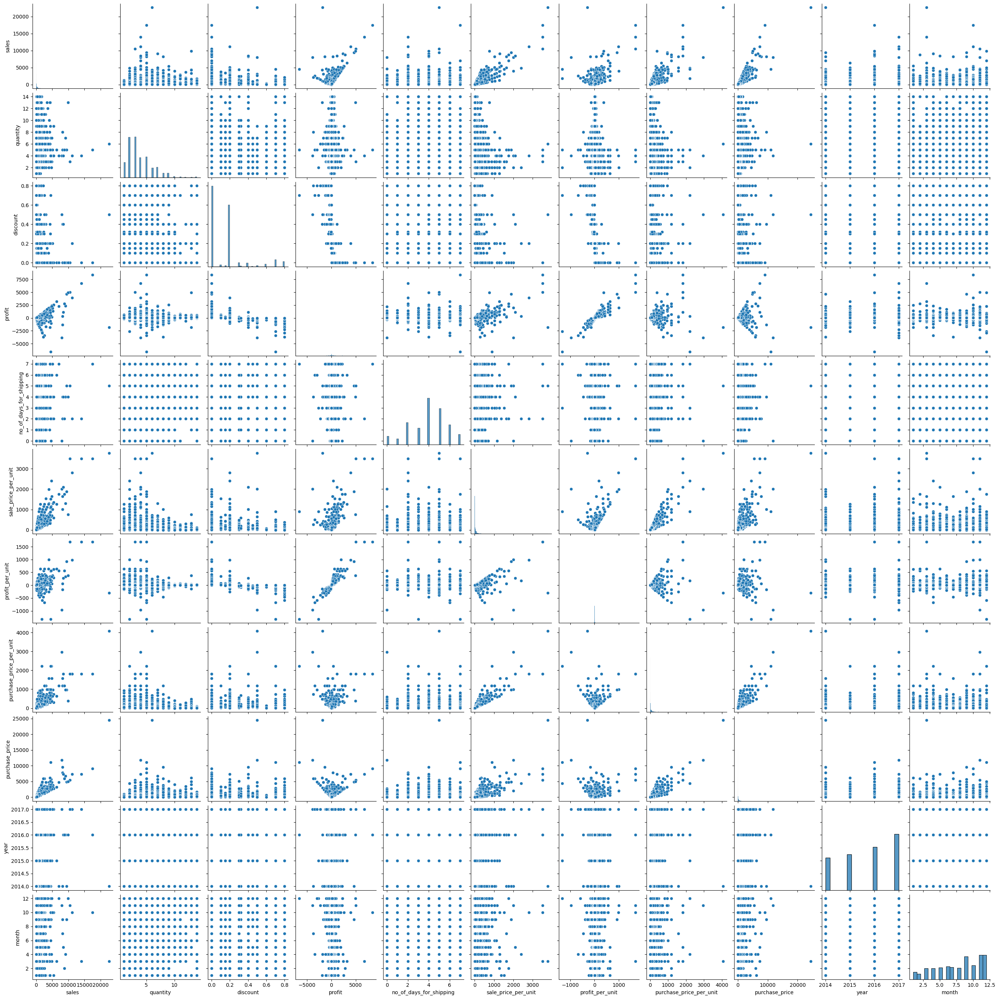

In [52]:
# b) Pair Plot
sns.pairplot(df)
plt.show()


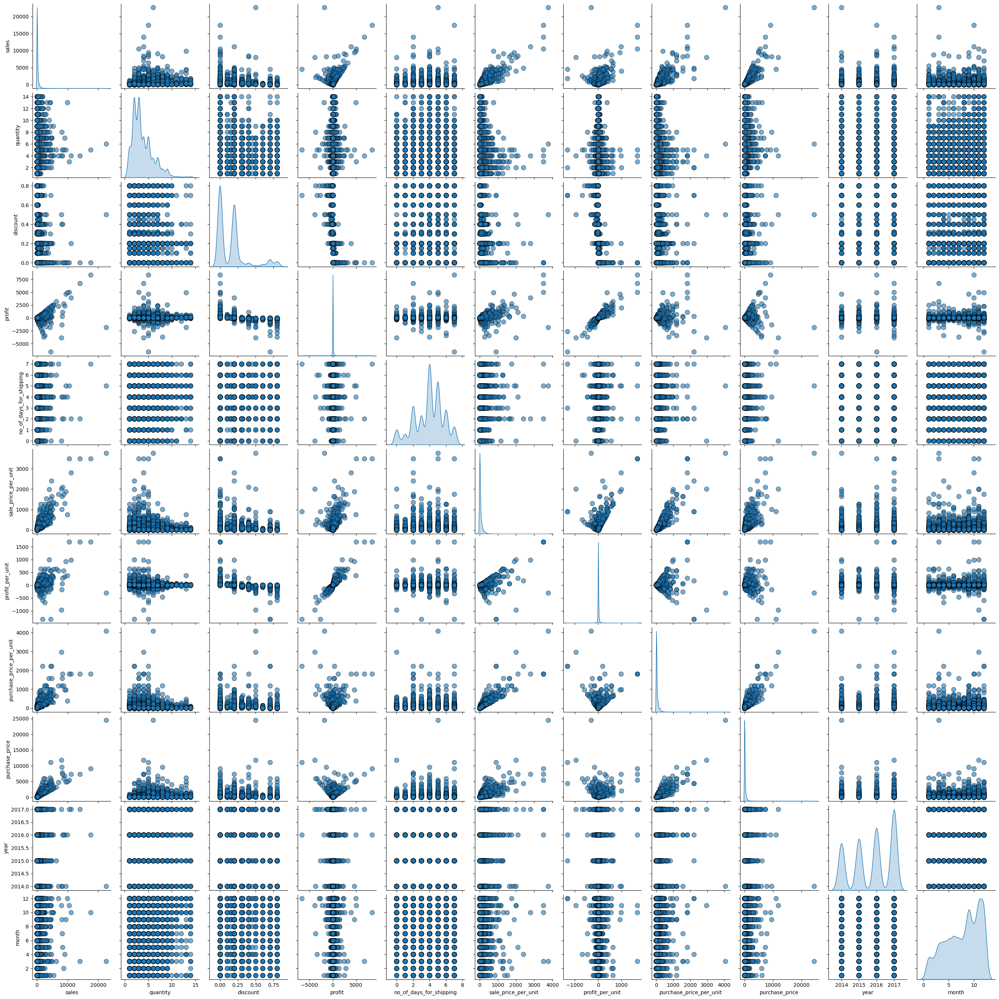

In [53]:
# c) Scatter Plot Matrix 
sns.pairplot(df, diag_kind='kde', plot_kws={'alpha': 0.6, 's': 80, 'edgecolor': 'k'})
plt.show()


In [54]:
profile = ProfileReport(df , title = 'Pandas Profiling Report', explorative = True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [55]:
#file_path = "/content/drive/My Drive/Sample-Superstore.csv"


In [56]:
%%capture
!wget -nc https://raw.githubusercontent.com/brpy/colab-pdf/master/colab_pdf.py
from colab_pdf import colab_pdf
#colab_pdf('ProjectV01.ipynb')
colab_pdf("/content/drive/My Drive/PythonProjects/ProjectV01.ipynb")

In [ ]:
!jupyter nbconvert --to html ProjectV01.ipynb
